<a href="https://colab.research.google.com/github/Daudi232/DS_3/blob/main/Thesis/Classification/EfficientNet_B3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INFO

This notebook includes experiments of classification using the pre-trained image net model EfficientNet-B3. Both the 704 and 4200 datasets were used.

Part 1 is just boiler-plate code that was written once, then copy pasted across all notebooks.

Part 2 has the experiments and results where classification is made for the full chest x-ray images. It includes experiments for the 704 and 4200 images datasets.

Part 3 starts with the segmentation of the chest-xray images using a u-net we trained, and the lungs region is extracted, then it follows with experiments and results where classification is made. The images are just the lung areas extracted. Part 3 was done in a separate notebook, but it has been merged with this one for organization purposes.

# PART 1: BOILER-PLATE

# CONFIGURATION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# IMPORTS AND INSTALLS

In [ ]:
!pip install grad-cam

In [ ]:
import pandas as pd
import numpy as np
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from torchvision import datasets, transforms

# HELPER FUNCTIONS

## Training Loop


### saving best weights

In [ ]:
def model_train_save(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, device='cpu'):


  model.to(device) # shift the model to GPU

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf

  for epoch in range(1, epochs+1):


    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

      if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model, save_path)

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

### using torch.compile

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from torchvision import datasets, transforms

import numpy as np
import time


def model_train_save_optim(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, device='cpu'):


  model.to(device) # shift the model to GPU
  model = torch.compile(model) #compile

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf

  for epoch in range(1, epochs+1):


    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

      if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model, save_path)

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

### with early stopping

In [ ]:
def model_train_save_es(model, train_data_loader, val_data_loader, optimizer, loss_fn, save_path, epochs = 30, patience = 10, device='cpu'):


  model.to(device) # shift the model to GPU

  # Metrics
  history = {'Training': {'Loss': [], 'Accuracy': [], 'Time': []},

             'Validation': {'Loss': [], 'Accuracy': [], 'Time': []}
  }

  best_val_loss = np.inf # for checkpointing best model
  count = 0 # for early stopping

  for epoch in range(1, epochs+1):

    # TRAIN
    model.train() # at the start of each epoch.. this is called before training. Meaningful when we have dropout/batch normalization

    time_train_start = time.time()
    train_loss = 0 # initialized at each start of the epoch
    epoch_correct_train = 0

    for batch, target in train_data_loader:
      input = batch.to(device) #moves the input from CPU To GPU
      target = target.to(device)
      output = model(input) #forward pass
      loss = loss_fn(output, target) #compute loss

      optimizer.zero_grad() #clear out any weights to 0s
      loss.backward() #compute gradients using back-prop
      optimizer.step() # update the weights

      train_loss += loss.data.item() #loss

      batch_correct_train = (output.argmax(dim=1) == target).sum().item() #accuracy
      epoch_correct_train += batch_correct_train

    time_train = (time.time() - time_train_start)/60
    train_loss /= len(train_data_loader) #here we average the error summed for all batches
    train_acc = epoch_correct_train/len(train_data_loader.dataset)

    history['Training']['Loss'].append(train_loss)
    history['Training']['Accuracy'].append(train_acc)
    history['Training']['Time'].append(time_train)


    # EVALUATE
    model.eval()
    time_val_start = time.time()

    val_loss = 0
    epoch_correct_val = 0

    with torch.no_grad():
      for batch, targets in val_data_loader:
        input = batch.to(device) #moves the input from CPU To GPU
        targets = targets.to(device)
        output = model(input)
        loss = loss_fn(output, targets)

        val_loss = val_loss + loss.data.item()

        batch_correct_val = (output.argmax(dim=1) == targets).sum().item()
        epoch_correct_val += batch_correct_val

      val_loss = val_loss/len(val_data_loader)
      val_acc = epoch_correct_val/len(val_data_loader.dataset)

      time_val = (time.time() - time_val_start)/60

      history['Validation']['Loss'].append(val_loss)
      history['Validation']['Accuracy'].append(val_acc)
      history['Validation']['Time'].append(time_val)

    if val_loss < best_val_loss:
      best_val_loss = val_loss
      count = 0 # initialize the early stopping counter
      torch.save(model, save_path)

    else: count += 1

    if count >= patience:
      print(f"Early stopping triggered at Epoch: {epoch}")
      break

    # Report
    print(f"Epoch: [{epoch}/{epochs}]\t Train Loss: {train_loss:.2f}\t\
    Val Loss: {val_loss:.2f}\t Train Acc: {train_acc:.2f}\t Val Acc: {val_acc:.2f}\
    Train Time: {time_train:.2f}\t Val Time: {time_val:.2f}")

  return history

## Predicting


### with test set

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

def model_predict(load_path, test_data_loader, device):

  model = torch.load(load_path, weights_only = False)

  model.to(device)
  model.eval()
  test_time_start = time.time()

  predictions = []
  actual = []
  all_probs = []


  with torch.no_grad():
    for batch, targets in test_data_loader:
      inputs, outputs = batch.to(device), targets.to(device)
      output = model(inputs)

      #predictions and targets
      predictions.append(output.argmax(dim = 1).cpu())
      actual.append(targets.cpu())

      #probabilities
      probs = F.softmax(output, dim = 1) # apply softmax to the batch, along the columns
      pos_probs = probs[:, 1] # fetch the second value, corresponding to class 1
      all_probs.append(pos_probs.cpu())

  test_time = (time.time() - test_time_start)/60

  combo_predictions = torch.cat(predictions, dim = 0)
  combo_targets = torch.cat(actual, dim = 0)
  combo_probs = torch.cat(all_probs, dim = 0)

  correct = (combo_predictions == combo_targets).sum().item()
  accuracy = correct/len(test_data_loader.dataset)

  f1 = f1_score(combo_targets.numpy(), combo_predictions.numpy())
  auc = roc_auc_score(combo_targets.numpy(), combo_probs.numpy())

  print('Prediction Metrics')
  print(f'Confusion Matrix: {confusion_matrix (combo_targets.numpy(), combo_predictions.numpy())}')
  print(f'Test Accuracy: {accuracy:.2f}')
  print(f'Test f1: {f1:.2f}')
  print(f'Test AUC: {auc:.2f}')
  print(f'Time: {test_time:.2f}')

  # Plotting the ROC

  fpr, tpr, thresholds = roc_curve(combo_targets.numpy(), combo_probs.numpy()) # <--- Get FPR and TPR

  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f'Model (AUC = {auc:.4f})') # <--- Plot the ROC curve
  plt.plot([0, 1], [0, 1], 'r--', label='Random Guess') # <--- Plot the diagonal line
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend()
  plt.grid(True)
  plt.show(); # <--- Display the plot


  return combo_predictions, all_probs, combo_targets

### with validation set

I think it is the same code, just different names. The idea was to avoid information leak when running multiple experiment runs

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, f1_score
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

def model_predict_val(load_path, val_data_loader, device):

  model = torch.load(load_path, weights_only = False)

  model.to(device)
  model.eval()
  test_time_start = time.time()

  predictions = []
  actual = []
  all_probs = []


  with torch.no_grad():
    for batch, targets in val_data_loader:
      inputs, outputs = batch.to(device), targets.to(device)
      output = model(inputs)

      #predictions and targets
      predictions.append(output.argmax(dim = 1).cpu())
      actual.append(targets.cpu())

      #probabilities
      probs = F.softmax(output, dim = 1) # apply softmax to the batch, along the columns
      pos_probs = probs[:, 1] # fetch the second value, corresponding to class 1
      all_probs.append(pos_probs.cpu())

  test_time = (time.time() - test_time_start)/60

  combo_predictions = torch.cat(predictions, dim = 0)
  combo_targets = torch.cat(actual, dim = 0)
  combo_probs = torch.cat(all_probs, dim = 0)

  correct = (combo_predictions == combo_targets).sum().item()
  accuracy = correct/len(val_data_loader.dataset)

  f1 = f1_score(combo_targets.numpy(), combo_predictions.numpy())
  auc = roc_auc_score(combo_targets.numpy(), combo_probs.numpy())


  print('Prediction Metrics')
  print(f'Confusion Matrix: {confusion_matrix (combo_targets.numpy(), combo_predictions.numpy())}')
  print(f'Accuracy: {accuracy:.2f}')
  print(f'f1: {f1:.2f}')
  print(f'AUC: {auc:.2f}')
  print(f'Time: {test_time:.2f}')

  # Plotting the ROC

  fpr, tpr, thresholds = roc_curve(combo_targets.numpy(), combo_probs.numpy()) # <--- Get FPR and TPR

  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f'Model (AUC = {auc:.4f})') # <--- Plot the ROC curve
  plt.plot([0, 1], [0, 1], 'r--', label='Random Guess') # <--- Plot the diagonal line
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend()
  plt.grid(True)
  plt.show(); # <--- Display the plot


  return combo_predictions, all_probs, combo_targets

## Plotting

In [ ]:
import matplotlib.pyplot as plt

def plot_results_new(history:dict):

  x = range(1, len(history['Training']['Loss'])+1)
  plt.plot(x, history['Training']['Loss'], label = 'Training Loss')
  plt.plot(x, history['Validation']['Loss'], label = 'Validation Loss')
  plt.legend()
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Training and Validation Loss')
  plt.show();

  plt.plot(x, history['Training']['Accuracy'], label = 'Training Accuracy')
  plt.plot(x, history['Validation']['Accuracy'], label = 'Validation Accuracy')
  plt.legend()
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.title('Training and Validation Accuracy')
  plt.show();

# PART 2: CLASSIFICATION ONLY

## DATA (704)

### Dataset Downloading

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("iamtapendu/chest-x-ray-lungs-segmentation")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'chest-x-ray-lungs-segmentation' dataset.
Path to dataset files: /kaggle/input/chest-x-ray-lungs-segmentation


### Structure and exploration

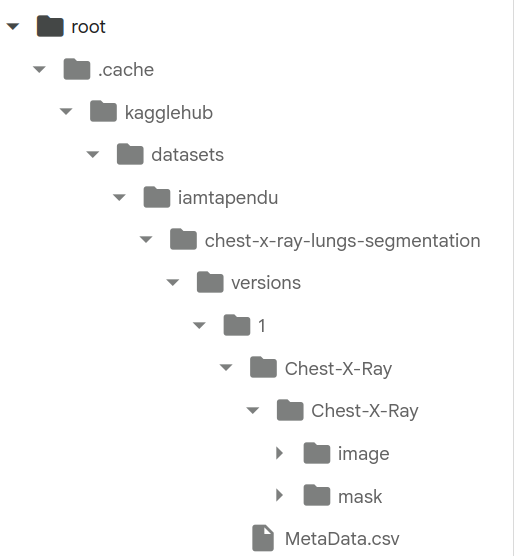

## SET UP OF THE DATABASE

In [ ]:
def create_split_folders(path):

  import os
  import pandas as pd

  # load the metadata
  metadata = pd.read_csv(os.path.join(path, 'MetaData.csv'))
  display (metadata.head())

  # Get the ids of the images corr to TB and no-TB
  img_id1 = list (metadata['id'][metadata['ptb'] == 1])
  img_id0 = list(metadata['id'][metadata['ptb'] == 0])

  print()
  print(f'# of TB images: {len(img_id1)}')
  print(f'# of Normal images: {len(img_id0)}')
  print(f'Total: {len(img_id1) + len(img_id0)}')

  # We will split train, validation and test set using 70%, 20% and 10%.
  # We will consider these ratios at the class level since we want every set
  # have a balanced number of images wrt the classes.

  train_ratio = 0.7
  val_ratio = 0.2
  test_ratio = 0.1

  # int uses floor, so the test set will have a couple more images than intended
  train_no_1 = int(train_ratio * len(img_id1))
  train_no_0 = int(train_ratio * len(img_id0))
  print(f'Train: {train_no_1} + {train_no_0} = {train_no_1 + train_no_0}')

  val_no_1 = int(val_ratio * len(img_id1))
  val_no_0 = int(val_ratio * len(img_id0))
  print(f'Validation: {val_no_1} + {val_no_0} = {val_no_1 + val_no_0}')

  test_no_1 = int(test_ratio * len(img_id1))
  test_no_0 = int(test_ratio * len(img_id0))
  print(f'Test: {test_no_1} + {test_no_0} = {test_no_1 + test_no_0}')

  # split
  train_1 = img_id1[:train_no_1]
  train_0 = img_id0[:train_no_0]
  train = train_1 + train_0
  print(f'Train set #: {len(train)}')

  val_1 = img_id1[train_no_1:train_no_1 + val_no_1]
  val_0 = img_id0[train_no_0:train_no_0 + val_no_0]
  val = val_1 + val_0
  print(f'Validation set #: {len(val)}')

  test_1 = img_id1[train_no_1 + val_no_1:]
  test_0 = img_id0[train_no_0 + val_no_0:]
  test = test_1 + test_0
  print(f'Test set #: {len(test)}')

  print(f'Total: {len(train) + len(val) + len(test)}')
  print()


  # Setup directories
  import os
  import shutil

  sets = ['train', 'val', 'test']
  klases = ['tb', 'no_tb']

  # get current directory
  current_path = os.getcwd()

  for st in sets:
    for klas in klases:
        if not os.path.exists(os.path.join(current_path, st, klas)):
          os.makedirs(os.path.join(current_path, st, klas))

  # path to the images
  path_images = os.path.join(path, 'Chest-X-Ray/Chest-X-Ray/image')

  #train
  for i in train_1:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'train/tb'))

  for i in train_0:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'train/no_tb'))

  # val
  for i in val_1:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'val/tb'))

  for i in val_0:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'val/no_tb'))

  #test
  for i in test_1:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'test/tb'))

  for i in test_0:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'test/no_tb'))

  print (f'Successfuly created Images Directory')

  sets = ['train', 'val', 'test']
  klases = ['tb', 'no_tb']


  print ('Confirm the number of images is valid')
  for st in sets:
    for klas in klases:
      ls = os.listdir(os.path.join(current_path, st, klas))
      print (f'{st}/{klas}: {len(ls)}')


  return img_id1, img_id0

# Apply function
img_id1, img_id0 = create_split_folders(path)

,id,gender,age,county,ptb,remarks
0,1000,male,31,Shenxhen,0,normal
1,1001,male,64,Shenxhen,0,normal
2,1002,male,35,Shenxhen,0,normal
3,1003,male,32,Shenxhen,1,"STB,ATB,tuberculosis pleuritis"
4,1004,male,2,Shenxhen,1,secondary PTB in the bilateral upper field



# of TB images: 345
# of Normal images: 359
Total: 704
Train: 241 + 251 = 492
Validation: 69 + 71 = 140
Test: 34 + 35 = 69
Train set #: 492
Validation set #: 140
Test set #: 72
Total: 704

Successfuly created Images Directory
Confirm the number of images is valid
train/tb: 241
train/no_tb: 251
val/tb: 69
val/no_tb: 71
test/tb: 35
test/no_tb: 37


## EFFICIENT NET-B3

In [ ]:
!pip install lovely-tensors

In [ ]:
import lovely_tensors as lt
lt.monkey_patch()

In [ ]:
from torchvision.models import efficientnet_b3

enet = efficientnet_b3(weights = 'DEFAULT')
print(enet)

In [ ]:
# FREEZE ALL
for param in enet.parameters():
  param.requires_grad = False

# UNFREEZE BATCH NORM
for module in enet.modules():
  if isinstance(module, nn.BatchNorm2d):
    for param in module.parameters():
      param.requires_grad = True

# ADD NEW CLASSIFIER HEAD
enet.classifier[1] = nn.Linear(enet.classifier[1].in_features, 2)

# VERIFICATION
print(enet.classifier)
print('CONV Layer:', enet.features[0][0].weight.requires_grad)
print('BN Layer:', enet.features[0][1].weight.requires_grad)

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=2, bias=True)
)
CONV Layer: False
BN Layer: True


## Data Pipeline

In [ ]:
from torchvision.models import EfficientNet_B3_Weights

# weights = ResNet50_Weights(weights = 'DEFAULT')
weights = EfficientNet_B3_Weights.DEFAULT

print('Default version:', weights.transforms())

Default version: ImageClassification(
    crop_size=[300]
    resize_size=[320]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


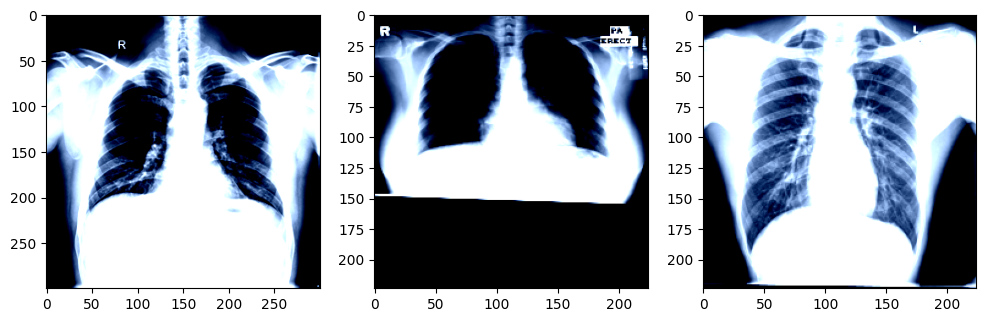

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

# for any randomization
torch.manual_seed(7)

## DATASET

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((300, 300)),
    T.RandomHorizontalFlip(p = 0.5),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225] )
])
)

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

# PLot the images in the sets to see if transformation was successfull.
fig, ax = plt.subplots(1, 3, figsize = (12, 8))

ax[0].imshow(train_td[0][0].permute(1, 2, 0));

ax[1].imshow(test_td[0][0].permute(1, 2, 0));

ax[2].imshow(val_td[0][0].permute(1, 2, 0));

## Run 1 training (few transformations)

Epoch: [1/25]	 Train Loss: 0.62	    Val Loss: 0.71	 Train Acc: 0.69	 Val Acc: 0.54    Train Time: 1.23	 Val Time: 0.53
Epoch: [2/25]	 Train Loss: 0.48	    Val Loss: 0.74	 Train Acc: 0.83	 Val Acc: 0.61    Train Time: 1.20	 Val Time: 0.54
Epoch: [3/25]	 Train Loss: 0.41	    Val Loss: 0.92	 Train Acc: 0.85	 Val Acc: 0.61    Train Time: 1.10	 Val Time: 0.55
Epoch: [4/25]	 Train Loss: 0.38	    Val Loss: 0.72	 Train Acc: 0.85	 Val Acc: 0.71    Train Time: 1.10	 Val Time: 0.52
Epoch: [5/25]	 Train Loss: 0.36	    Val Loss: 0.60	 Train Acc: 0.86	 Val Acc: 0.69    Train Time: 1.11	 Val Time: 0.53
Epoch: [6/25]	 Train Loss: 0.36	    Val Loss: 0.58	 Train Acc: 0.86	 Val Acc: 0.71    Train Time: 1.11	 Val Time: 0.54
Epoch: [7/25]	 Train Loss: 0.30	    Val Loss: 0.55	 Train Acc: 0.88	 Val Acc: 0.71    Train Time: 1.09	 Val Time: 0.51
Epoch: [8/25]	 Train Loss: 0.31	    Val Loss: 0.55	 Train Acc: 0.87	 Val Acc: 0.68    Train Time: 1.09	 Val Time: 0.52
Epoch: [9/25]	 Train Loss: 0.30	    Val Loss: 0.

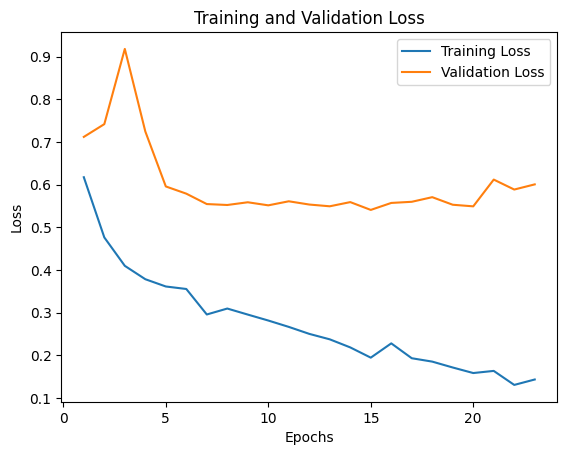

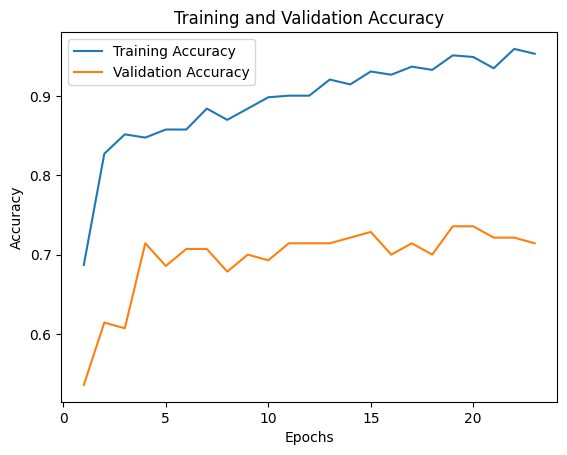

Training time : 25.51
Validation time : 12.28
Prediction Metrics
Confusion Matrix: [[27 10]
 [13 22]]
Test Accuracy: 0.68
Test f1: 0.66
Test AUC: 0.71
Time: 0.43


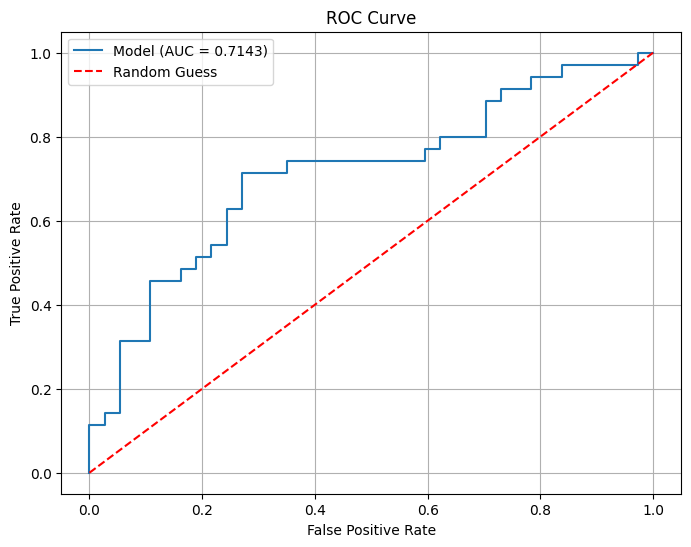

In [ ]:
# TRAINING

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(enet.parameters(), lr = 0.001, betas = (0.9, 0.99))

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
path_classification = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification'
save_path = os.path.join(path_classification, 'efficient_net_run1.pt')

history_train = model_train_save_es(enet, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 25, patience = 8, device = device
)

#plot
plot_results_new(history_train)

# total time taken for training and validation
print(f"Training time : {sum(history_train['Training']['Time']):.2f}")
print(f"Validation time : {sum(history_train['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

## Run 2 training (more transformations)

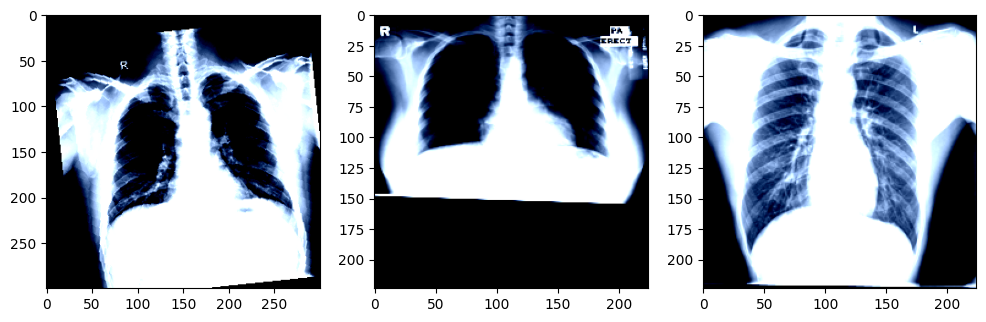

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

# for any randomization
torch.manual_seed(7)

## DATASET

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((300, 300)),
    T.RandomHorizontalFlip(p = 0.5),
    T.RandomAffine(degrees = 10, #patient is not always straight
                       translate = (0.1, 0.1), #shift it vertically and horizontally from the center
                       scale = (0.9, 1.1)), # controls the size of the lungs
    T.ColorJitter(brightness = 0.2, contrast = 0.2),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])
)

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

# PLot the images in the sets to see if transformation was successfull.
fig, ax = plt.subplots(1, 3, figsize = (12, 8))

ax[0].imshow(train_td[0][0].permute(1, 2, 0));

ax[1].imshow(test_td[0][0].permute(1, 2, 0));

ax[2].imshow(val_td[0][0].permute(1, 2, 0));

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=2, bias=True)
)
CONV Layer: False
BN Layer: True
Epoch: [1/20]	 Train Loss: 0.65	    Val Loss: 0.71	 Train Acc: 0.61	 Val Acc: 0.54    Train Time: 1.10	 Val Time: 0.53
Epoch: [2/20]	 Train Loss: 0.57	    Val Loss: 0.68	 Train Acc: 0.75	 Val Acc: 0.58    Train Time: 1.11	 Val Time: 0.52
Epoch: [3/20]	 Train Loss: 0.52	    Val Loss: 0.62	 Train Acc: 0.78	 Val Acc: 0.72    Train Time: 1.13	 Val Time: 0.52
Epoch: [4/20]	 Train Loss: 0.50	    Val Loss: 0.59	 Train Acc: 0.78	 Val Acc: 0.69    Train Time: 1.11	 Val Time: 0.53
Epoch: [5/20]	 Train Loss: 0.46	    Val Loss: 0.58	 Train Acc: 0.78	 Val Acc: 0.68    Train Time: 1.11	 Val Time: 0.52
Epoch: [6/20]	 Train Loss: 0.43	    Val Loss: 0.55	 Train Acc: 0.83	 Val Acc: 0.70    Train Time: 1.12	 Val Time: 0.53
Epoch: [7/20]	 Train Loss: 0.42	    Val Loss: 0.54	 Train Acc: 0.83	 Val Acc: 0.71    Train Time: 1.12	 Val Time: 0.52
Epoch: [8/20]	 Train Loss

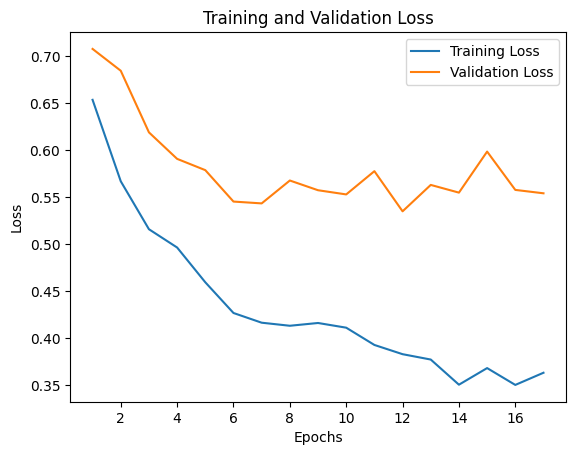

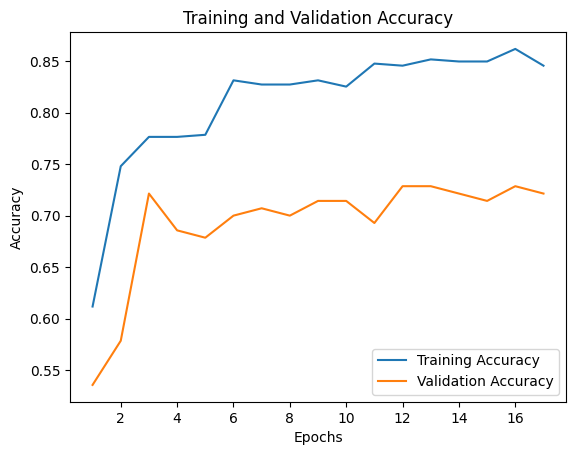

Training time : 18.99
Validation time : 8.96
Prediction Metrics
Confusion Matrix: [[33  4]
 [10 25]]
Test Accuracy: 0.81
Test f1: 0.78
Test AUC: 0.85
Time: 0.40


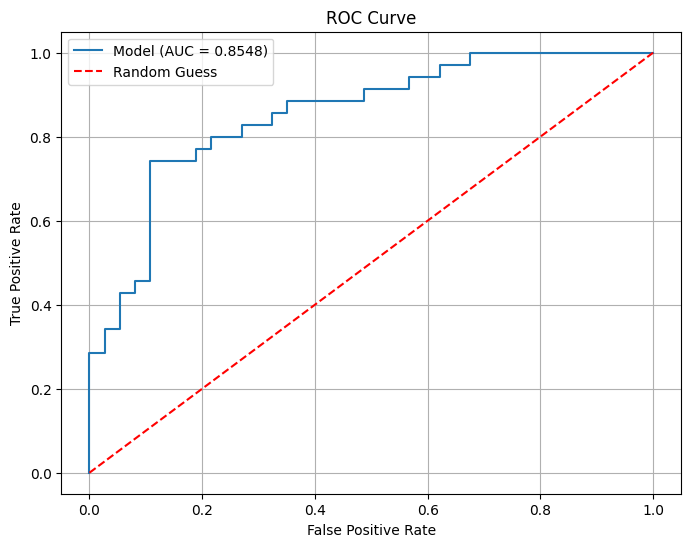

In [ ]:
# model
enet = efficientnet_b3(weights = 'DEFAULT')

# FREEZE ALL
for param in enet.parameters():
  param.requires_grad = False

# UNFREEZE BATCH NORM
for module in enet.modules():
  if isinstance(module, nn.BatchNorm2d):
    for param in module.parameters():
      param.requires_grad = True

# ADD NEW CLASSIFIER HEAD
enet.classifier[1] = nn.Linear(enet.classifier[1].in_features, 2)

# VERIFICATION
print(enet.classifier)
print('CONV Layer:', enet.features[0][0].weight.requires_grad)
print('BN Layer:', enet.features[0][1].weight.requires_grad)


# TRAINING
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(enet.parameters(), lr = 0.001, betas = (0.9, 0.99))

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
path_classification = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification'
save_path = os.path.join(path_classification, 'efficient_net_run2.pt')

history_train = model_train_save_es(enet, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 20, patience = 5, device = device
)

#plot
plot_results_new(history_train)

# total time taken for training and validation
print(f"Training time : {sum(history_train['Training']['Time']):.2f}")
print(f"Validation time : {sum(history_train['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

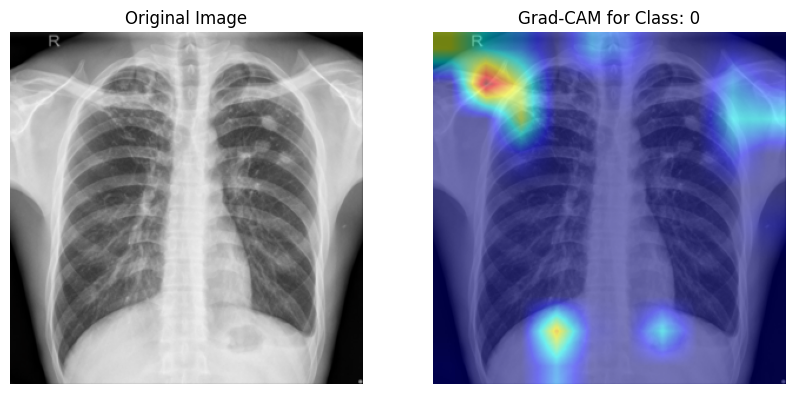

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- 1. Define Helper Function to De-normalize Image for Plotting ---
def deprocess_image(tensor):
    """Reverses normalization to get back to a [0, 1] range for plotting."""
    tensor = tensor.squeeze().cpu().detach().clone()

    # Standard ImageNet normalization stats (used by EfficientNet)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    # Un-normalize
    tensor = (tensor * std) + mean
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

# -----------------------------------------------------------------
# --- 2. Prepare Model ---
# -----------------------------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Ensure the model is in eval mode (for Dropout/BN)
enet.eval()
enet.to(device)

# CRITICAL: Grad-CAM needs gradients to flow back to the target layer.
# Even if you froze the backbone during training, you must set requires_grad=True
# for the feature layers now to compute the gradients for visualization.
for param in enet.features.parameters():
    param.requires_grad = True

# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# For EfficientNet, the last convolutional layer is the last block of 'features'.
# Specifically, we target the last sub-module of the features list.
target_layer = enet.features[-1]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
IMAGE_PATH = './train/tb/1003.png' # Ensure this path is correct
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# Define your validation transforms if 'transforms' is not already defined in memory.
# (If you already have 'transforms' defined from your training code, you can skip this block)
inference_transforms = T.Compose([
    T.Resize((300, 300)), # EfficientNet B3 uses 300x300
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Use the transforms available in memory or the one defined above
# input_tensor = transforms(img_pil).unsqueeze(0).to(device) # If using your existing transforms
input_tensor = inference_transforms(img_pil).unsqueeze(0).to(device)

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
# A. Initialize GradCAM
cam = GradCAM(model=enet, target_layers=[target_layer])

# B. Define the target class (0 = TB, 1 = Normal usually, check your class_to_idx)
TARGET_CLASS = 0
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the forward/backward pass to compute importance
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the result
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
# Get the de-normalized image for plotting
rgb_img_for_plot = deprocess_image(input_tensor)

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

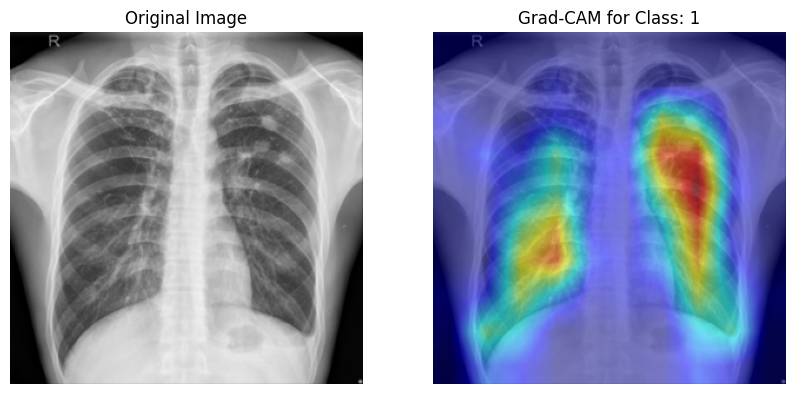

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- 1. Define Helper Function to De-normalize Image for Plotting ---
def deprocess_image(tensor):
    """Reverses normalization to get back to a [0, 1] range for plotting."""
    tensor = tensor.squeeze().cpu().detach().clone()

    # Standard ImageNet normalization stats (used by EfficientNet)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    # Un-normalize
    tensor = (tensor * std) + mean
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

# -----------------------------------------------------------------
# --- 2. Prepare Model ---
# -----------------------------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Ensure the model is in eval mode (for Dropout/BN)
enet.eval()
enet.to(device)

# CRITICAL: Grad-CAM needs gradients to flow back to the target layer.
# Even if you froze the backbone during training, you must set requires_grad=True
# for the feature layers now to compute the gradients for visualization.
for param in enet.features.parameters():
    param.requires_grad = True

# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# For EfficientNet, the last convolutional layer is the last block of 'features'.
# Specifically, we target the last sub-module of the features list.
target_layer = enet.features[-1]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
IMAGE_PATH = './train/tb/1003.png' # Ensure this path is correct
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# Define your validation transforms if 'transforms' is not already defined in memory.
# (If you already have 'transforms' defined from your training code, you can skip this block)
inference_transforms = T.Compose([
    T.Resize((300, 300)), # EfficientNet B3 uses 300x300
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Use the transforms available in memory or the one defined above
# input_tensor = transforms(img_pil).unsqueeze(0).to(device) # If using your existing transforms
input_tensor = inference_transforms(img_pil).unsqueeze(0).to(device)

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
# A. Initialize GradCAM
cam = GradCAM(model=enet, target_layers=[target_layer])

# B. Define the target class (0 = TB, 1 = Normal usually, check your class_to_idx)
TARGET_CLASS = 1
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the forward/backward pass to compute importance
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the result
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
# Get the de-normalized image for plotting
rgb_img_for_plot = deprocess_image(input_tensor)

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

## DATA (4200)

### Dataset Downloading

In [ ]:
## Download data

import kagglehub

# Download latest version
path_rahman = kagglehub.dataset_download("tawsifurrahman/tuberculosis-tb-chest-xray-dataset")

print("Path to dataset files:", path_rahman)

100%|██████████| 663M/663M [00:22<00:00, 31.2MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tawsifurrahman/tuberculosis-tb-chest-xray-dataset/versions/3


### Database setup


# of TB images: 700
# of Normal images: 3500
Total: 4200
Train set #: 3360
Validation set #: 420
Test set #: 420
Total: 4200
Copying images...
Successfully created Train/Val/Test Directories


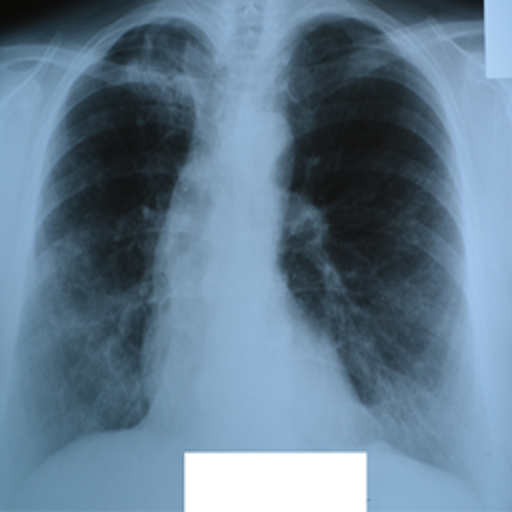

In [ ]:
import os
import pandas as pd
import PIL
import shutil

def create_images_folder_4200(path):
  '''
  This is refactored version for use in classification and not segmentation.
  '''

  tb_md = pd.read_excel(os.path.join(path,'TB_Chest_Radiography_Database', 'Tuberculosis.metadata.xlsx'))
  no_tb_md = pd.read_excel(os.path.join(path,'TB_Chest_Radiography_Database', 'Normal.metadata.xlsx'))

  # Get the ids of the images corr to TB and no-TB
  img_id1 = list(tb_md['FILE NAME'])
  img_id0 = list(no_tb_md['FILE NAME'])

  print()
  print(f'# of TB images: {len(img_id1)}')
  print(f'# of Normal images: {len(img_id0)}')
  print(f'Total: {len(img_id1) + len(img_id0)}')

  # We will split train, validation and test set using 80%, 10% and 10%.
  train_ratio = 0.8
  val_ratio = 0.1
  test_ratio = 0.1

  # Calculate counts
  train_no_1 = int(train_ratio * len(img_id1))
  train_no_0 = int(train_ratio * len(img_id0))

  val_no_1 = int(val_ratio * len(img_id1))
  val_no_0 = int(val_ratio * len(img_id0))

  test_no_1 = int(test_ratio * len(img_id1))
  test_no_0 = int(test_ratio * len(img_id0))

  # Split the lists (Slicing)
  train_1 = img_id1[:train_no_1]
  train_0 = img_id0[:train_no_0]
  train = train_1 + train_0
  print(f'Train set #: {len(train)}')

  val_1 = img_id1[train_no_1:train_no_1 + val_no_1]
  val_0 = img_id0[train_no_0:train_no_0 + val_no_0]
  val = val_1 + val_0
  print(f'Validation set #: {len(val)}')

  test_1 = img_id1[train_no_1 + val_no_1:]
  test_0 = img_id0[train_no_0 + val_no_0:]
  test = test_1 + test_0
  print(f'Test set #: {len(test)}')

  print(f'Total: {len(train) + len(val) + len(test)}')

  ## --- REFACTOR START ---

  # 1. Update sets to create train, val, test folders
  sets = ['train', 'val', 'test']
  klases = ['tb', 'no_tb']

  current_path = os.getcwd()

  # 2. Existing loop creates the directory tree: train/tb, train/no_tb, etc.
  for s in sets:
      for klas in klases:
        target_dir = os.path.join(current_path, s, klas)
        if not os.path.exists(target_dir):
          os.makedirs(target_dir)

  path_tb_images = os.path.join(path, 'TB_Chest_Radiography_Database', 'Tuberculosis')
  path_no_tb_images = os.path.join(path, 'TB_Chest_Radiography_Database', 'Normal')

  # 3. Define tasks to map specific ID lists to their destination folder
  # Format: (List of IDs, Destination Folder, Class Name, Source Path)
  tasks = [
      (train_1, 'train', 'tb', path_tb_images),
      (val_1,   'val',   'tb', path_tb_images),
      (test_1,  'test',  'tb', path_tb_images),
      (train_0, 'train', 'no_tb', path_no_tb_images),
      (val_0,   'val',   'no_tb', path_no_tb_images),
      (test_0,  'test',  'no_tb', path_no_tb_images),
  ]

  # 4. Loop through tasks and copy images
  print("Copying images...")
  for ids, folder, klas, source_dir in tasks:
      for i in ids:
          str_i = str(i) + '.png'
          # Copy from source to current_path/folder/class/image.png
          shutil.copy(
              src=os.path.join(source_dir, str_i),
              dst=os.path.join(current_path, folder, klas, str_i)
          )

  print(f'Successfully created Train/Val/Test Directories')
  ## --- REFACTOR END ---

  return img_id1, img_id0

# create
img_id1, img_id0 = create_images_folder_4200(path_rahman)

# show image
path_image = './train/tb/Tuberculosis-1.png'
PIL.Image.open(path_image)

## EFFICIENT NET-B3

In [ ]:
!pip install lovely-tensors

In [ ]:
import lovely_tensors as lt
lt.monkey_patch()

In [ ]:
from torchvision.models import efficientnet_b3

enet = efficientnet_b3(weights = 'DEFAULT')
print(enet)

In [ ]:
# FREEZE ALL
for param in enet.parameters():
  param.requires_grad = False

# UNFREEZE BATCH NORM
for module in enet.modules():
  if isinstance(module, nn.BatchNorm2d):
    for param in module.parameters():
      param.requires_grad = True

# ADD NEW CLASSIFIER HEAD
enet.classifier[1] = nn.Linear(enet.classifier[1].in_features, 2)

# VERIFICATION
print(enet.classifier)
print('CONV Layer:', enet.features[0][0].weight.requires_grad)
print('BN Layer:', enet.features[0][1].weight.requires_grad)

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=2, bias=True)
)
CONV Layer: False
BN Layer: True


## Data Pipeline

In [ ]:
from torchvision.models import EfficientNet_B3_Weights

# weights = ResNet50_Weights(weights = 'DEFAULT')
weights = EfficientNet_B3_Weights.DEFAULT

print('Default version:', weights.transforms())

Default version: ImageClassification(
    crop_size=[300]
    resize_size=[320]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


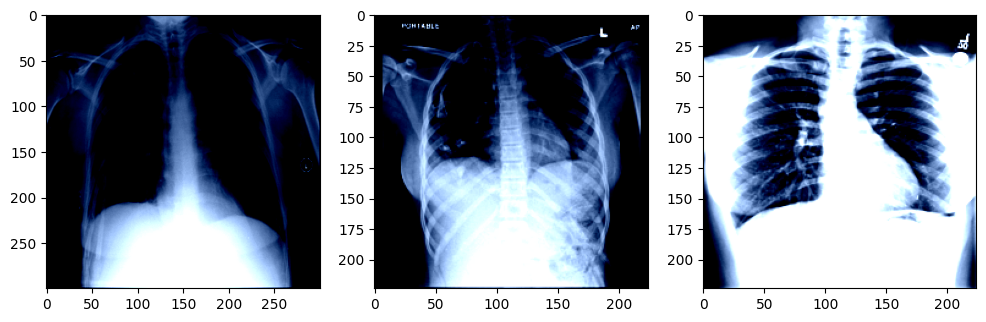

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

# for any randomization
torch.manual_seed(7)

## DATASET

train_td = ImageFolder(root = './train', transform = T.Compose([
    T.Resize((300, 300)),
    T.RandomHorizontalFlip(p = 0.5),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225] )
])
)

transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

# PLot the images in the sets to see if transformation was successfull.
fig, ax = plt.subplots(1, 3, figsize = (12, 8))

ax[0].imshow(train_td[0][0].permute(1, 2, 0));

ax[1].imshow(test_td[0][0].permute(1, 2, 0));

ax[2].imshow(val_td[0][0].permute(1, 2, 0));

## Training

Epoch: [1/15]	 Train Loss: 0.14	    Val Loss: 0.12	 Train Acc: 0.95	 Val Acc: 0.97    Train Time: 1.58	 Val Time: 0.12
Epoch: [2/15]	 Train Loss: 0.04	    Val Loss: 0.08	 Train Acc: 0.99	 Val Acc: 0.98    Train Time: 1.54	 Val Time: 0.09
Epoch: [3/15]	 Train Loss: 0.02	    Val Loss: 0.07	 Train Acc: 0.99	 Val Acc: 0.98    Train Time: 1.50	 Val Time: 0.09
Epoch: [4/15]	 Train Loss: 0.01	    Val Loss: 0.05	 Train Acc: 1.00	 Val Acc: 0.99    Train Time: 1.50	 Val Time: 0.10
Epoch: [5/15]	 Train Loss: 0.01	    Val Loss: 0.06	 Train Acc: 1.00	 Val Acc: 0.99    Train Time: 1.49	 Val Time: 0.10
Epoch: [6/15]	 Train Loss: 0.01	    Val Loss: 0.02	 Train Acc: 1.00	 Val Acc: 0.99    Train Time: 1.49	 Val Time: 0.10
Epoch: [7/15]	 Train Loss: 0.01	    Val Loss: 0.03	 Train Acc: 1.00	 Val Acc: 0.99    Train Time: 1.50	 Val Time: 0.09
Epoch: [8/15]	 Train Loss: 0.01	    Val Loss: 0.02	 Train Acc: 1.00	 Val Acc: 0.99    Train Time: 1.50	 Val Time: 0.09
Epoch: [9/15]	 Train Loss: 0.01	    Val Loss: 0.

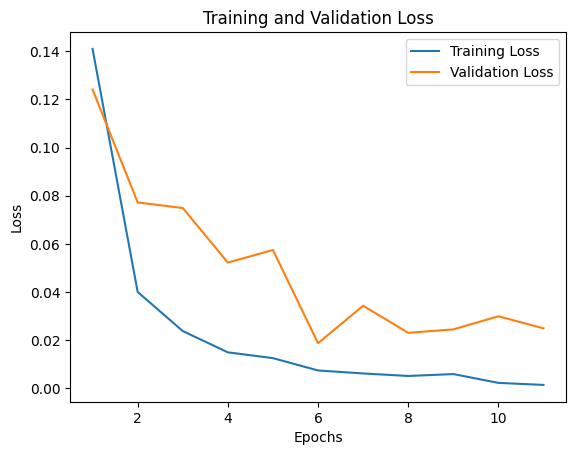

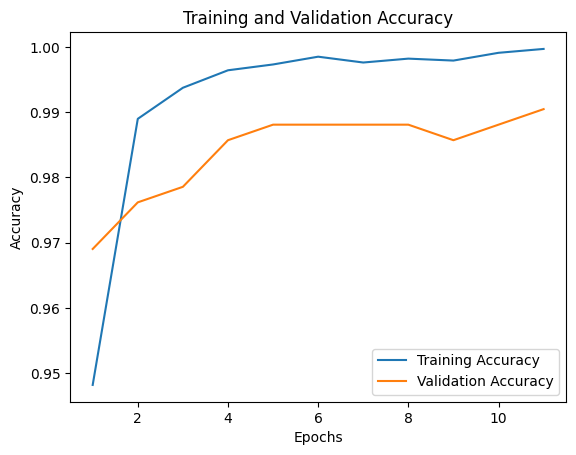

Training time : 16.58
Validation time : 1.09
Prediction Metrics
Confusion Matrix: [[349   1]
 [  7  63]]
Test Accuracy: 0.98
Test f1: 0.94
Test AUC: 0.99
Time: 0.09


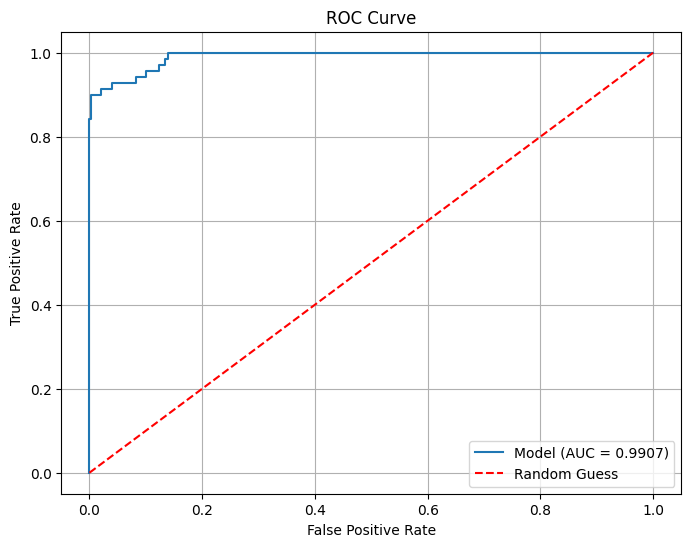

In [ ]:
# TRAINING

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(enet.parameters(), lr = 0.001, betas = (0.9, 0.99))

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
path_classification = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification'
save_path = os.path.join(path_classification, 'efficient_net_4200.pt')

history_train = model_train_save_es(enet, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 15, patience = 5, device = device
)

#plot
plot_results_new(history_train)

# total time taken for training and validation
print(f"Training time : {sum(history_train['Training']['Time']):.2f}")
print(f"Validation time : {sum(history_train['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)

## CAM

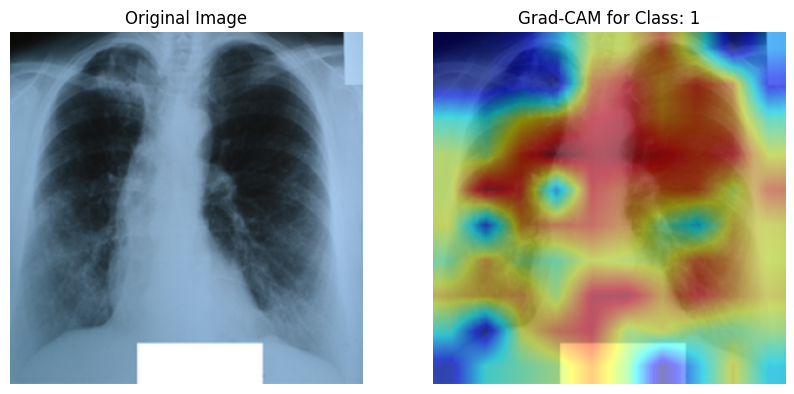

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- 1. Define Helper Function to De-normalize Image for Plotting ---
def deprocess_image(tensor):
    """Reverses normalization to get back to a [0, 1] range for plotting."""
    tensor = tensor.squeeze().cpu().detach().clone()

    # Standard ImageNet normalization stats (used by EfficientNet)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    # Un-normalize
    tensor = (tensor * std) + mean
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

# -----------------------------------------------------------------
# --- 2. Prepare Model ---
# -----------------------------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Ensure the model is in eval mode (for Dropout/BN)
enet.eval()
enet.to(device)

# CRITICAL: Grad-CAM needs gradients to flow back to the target layer.
# Even if you froze the backbone during training, you must set requires_grad=True
# for the feature layers now to compute the gradients for visualization.
for param in enet.features.parameters():
    param.requires_grad = True

# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# For EfficientNet, the last convolutional layer is the last block of 'features'.
# Specifically, we target the last sub-module of the features list.
target_layer = enet.features[-1]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
IMAGE_PATH = './train/tb/Tuberculosis-1.png' # Ensure this path is correct
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# Define your validation transforms if 'transforms' is not already defined in memory.
# (If you already have 'transforms' defined from your training code, you can skip this block)
inference_transforms = T.Compose([
    T.Resize((300, 300)), # EfficientNet B3 uses 300x300
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Use the transforms available in memory or the one defined above
# input_tensor = transforms(img_pil).unsqueeze(0).to(device) # If using your existing transforms
input_tensor = inference_transforms(img_pil).unsqueeze(0).to(device)

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
# A. Initialize GradCAM
cam = GradCAM(model=enet, target_layers=[target_layer])

# B. Define the target class (0 = TB, 1 = Normal usually, check your class_to_idx)
TARGET_CLASS = 1
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the forward/backward pass to compute importance
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the result
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
# Get the de-normalized image for plotting
rgb_img_for_plot = deprocess_image(input_tensor)

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

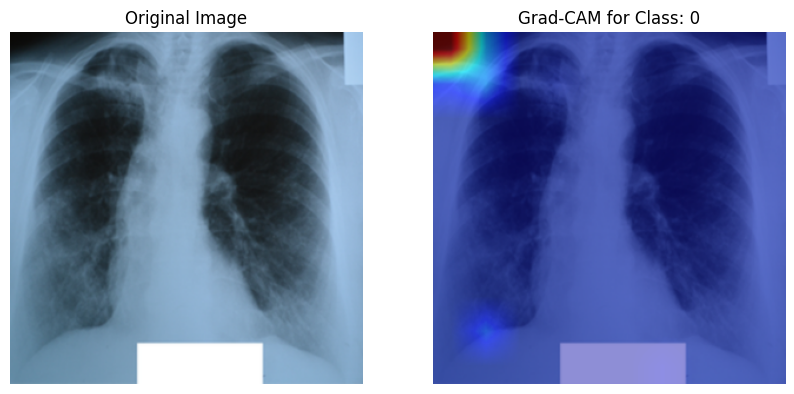

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Import the Grad-CAM library
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- 1. Define Helper Function to De-normalize Image for Plotting ---
def deprocess_image(tensor):
    """Reverses normalization to get back to a [0, 1] range for plotting."""
    tensor = tensor.squeeze().cpu().detach().clone()

    # Standard ImageNet normalization stats (used by EfficientNet)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    # Un-normalize
    tensor = (tensor * std) + mean
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

# -----------------------------------------------------------------
# --- 2. Prepare Model ---
# -----------------------------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Ensure the model is in eval mode (for Dropout/BN)
enet.eval()
enet.to(device)

# CRITICAL: Grad-CAM needs gradients to flow back to the target layer.
# Even if you froze the backbone during training, you must set requires_grad=True
# for the feature layers now to compute the gradients for visualization.
for param in enet.features.parameters():
    param.requires_grad = True

# -----------------------------------------------------------------
# --- 3. Identify the Target Layer ---
# -----------------------------------------------------------------
# For EfficientNet, the last convolutional layer is the last block of 'features'.
# Specifically, we target the last sub-module of the features list.
target_layer = enet.features[-1]

# -----------------------------------------------------------------
# --- 4. Load and Pre-process Your Image ---
# -----------------------------------------------------------------
IMAGE_PATH = './train/tb/Tuberculosis-1.png' # Ensure this path is correct
img_pil = Image.open(IMAGE_PATH).convert('RGB')

# Define your validation transforms if 'transforms' is not already defined in memory.
# (If you already have 'transforms' defined from your training code, you can skip this block)
inference_transforms = T.Compose([
    T.Resize((300, 300)), # EfficientNet B3 uses 300x300
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Use the transforms available in memory or the one defined above
# input_tensor = transforms(img_pil).unsqueeze(0).to(device) # If using your existing transforms
input_tensor = inference_transforms(img_pil).unsqueeze(0).to(device)

# -----------------------------------------------------------------
# --- 5. Run Grad-CAM ---
# -----------------------------------------------------------------
# A. Initialize GradCAM
cam = GradCAM(model=enet, target_layers=[target_layer])

# B. Define the target class (0 = TB, 1 = Normal usually, check your class_to_idx)
TARGET_CLASS = 0
targets = [ClassifierOutputTarget(TARGET_CLASS)]

# C. Generate the CAM
# This runs the forward/backward pass to compute importance
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# D. Get the result
grayscale_cam = grayscale_cam[0, :]

# -----------------------------------------------------------------
# --- 6. Visualize the Results ---
# -----------------------------------------------------------------
# Get the de-normalized image for plotting
rgb_img_for_plot = deprocess_image(input_tensor)

# Overlay the CAM heatmap on the original image
cam_image = show_cam_on_image(rgb_img_for_plot, grayscale_cam, use_rgb=True)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(rgb_img_for_plot)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title(f"Grad-CAM for Class: {TARGET_CLASS}")
plt.axis('off')

plt.show()

#PART 3: CLASSIFICATION AND SEGMENTATION

## SEGMENT 704 IMAGES

In [ ]:
path_segmentation = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/segmentation'

### Dataset Downloading

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("iamtapendu/chest-x-ray-lungs-segmentation")

print("Path to dataset files:", path)

100%|██████████| 3.59G/3.59G [02:05<00:00, 30.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/iamtapendu/chest-x-ray-lungs-segmentation/versions/1


### Structure and exploration

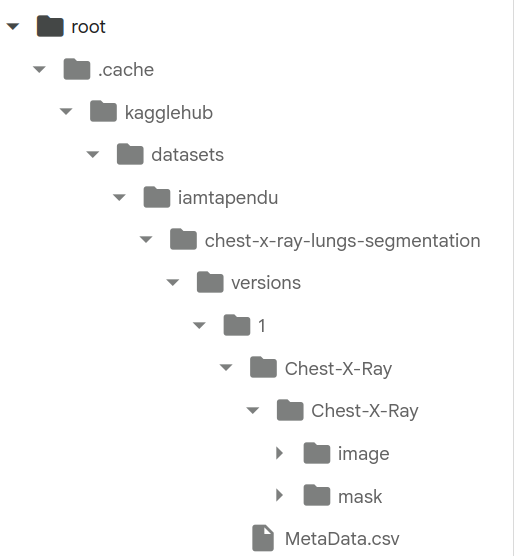

## SET UP OF THE DATABASE

,id,gender,age,county,ptb,remarks
0,1000,male,31,Shenxhen,0,normal
1,1001,male,64,Shenxhen,0,normal
2,1002,male,35,Shenxhen,0,normal
3,1003,male,32,Shenxhen,1,"STB,ATB,tuberculosis pleuritis"
4,1004,male,2,Shenxhen,1,secondary PTB in the bilateral upper field



# of TB images: 345
# of Normal images: 359
Total: 704
Successfuly created Images Directory


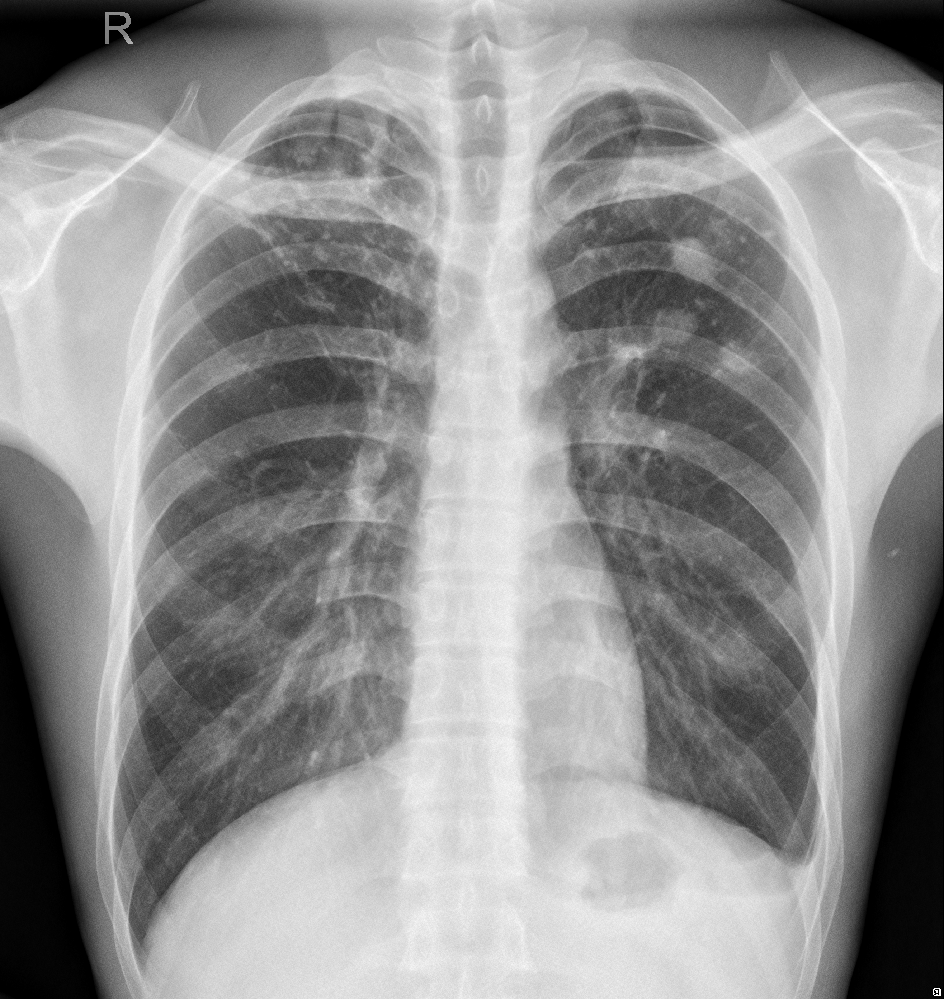

In [ ]:
def create_images_folder(path):

  ''' Argument is the path to the folder the xrays have been downloaded
  Creates an image directory filled with images, and a roi_images directory
  that is empty.
  Returns images list from TB and NO-TB Classes.'''

  import os
  import pandas as pd

  # load the metadata
  metadata = pd.read_csv(os.path.join(path, 'MetaData.csv'))
  display (metadata.head())

  # Get the ids of the images corr to TB and no-TB
  img_id1 = list (metadata['id'][metadata['ptb'] == 1])
  img_id0 = list(metadata['id'][metadata['ptb'] == 0])

  print()
  print(f'# of TB images: {len(img_id1)}')
  print(f'# of Normal images: {len(img_id0)}')
  print(f'Total: {len(img_id1) + len(img_id0)}')

  ## set up image and roi_images directory

  import os
  import shutil

  sets = ['Images',
          # 'ROI_Images'
          ]
  klases = ['tb', 'no_tb']

  # get current directory
  current_path = os.getcwd()

  for st in sets:
    for klas in klases:
        if not os.path.exists(os.path.join(current_path, st, klas)):
          os.makedirs(os.path.join(current_path, st, klas))

  # path to the images
  path_images = os.path.join(path, 'Chest-X-Ray/Chest-X-Ray/image')

  # copying from the image path to set up directories

  # TB Images
  for i in img_id1:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'Images', 'tb'))

  # No TB Images
  for i in img_id0:
    str_i = str(i) + '.png' #convert id into image id string
    shutil.copy(src = os.path.join(path_images,str_i), dst = os.path.join(current_path,'Images','no_tb'))

  print (f'Successfuly created Images Directory')

  return img_id1, img_id0

img_id1, img_id0 = create_images_folder(path)

# show sample image

import PIL

path_image = './Images/tb/1003.png'
PIL.Image.open(path_image)

### Load model for segmentation

In [ ]:
from torchvision.models import vgg16_bn
import torch.nn as nn


# CONV AND UP_CONV LAYERS
def conv(in_channels, out_channels):
  return nn.Sequential(
      nn.Conv2d(in_channels, out_channels, kernel_size = 3, stride=1, padding = 1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True)
  )

def up_conv(in_channels, out_channels):
  return nn.Sequential(
      nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 2, stride = 2),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True)
  )


# UNET CLASS
class UNet(nn.Module):

  def __init__(self, num_classes = 2):
    super().__init__()

    self.encoder = vgg16_bn(weights = 'DEFAULT').features

    self.block1 = nn.Sequential(*self.encoder[:6])
    self.block2 = nn.Sequential(*self.encoder[6:13])
    self.block3 = nn.Sequential(*self.encoder[13:20])
    self.block4 = nn.Sequential(*self.encoder[20:27])
    self.block5 = nn.Sequential(*self.encoder[27:34])

    self.bottleneck = nn.Sequential(*self.encoder[34:])
    self.conv_bottleneck = conv(512, 1024) #increase channels. prepare for upsampling

    self.up_conv6 = up_conv(1024, 512)
    self.conv6 = conv(512 + 512, 512)
    self.up_conv7 = up_conv(512, 256)
    self.conv7 = conv(256 + 512, 256)
    self.up_conv8 = up_conv(256, 128)
    self.conv8 = conv(128 + 256, 128)
    self.up_conv9 = up_conv(128, 64)
    self.conv9 = conv(64 + 128, 64)
    self.up_conv10 = up_conv(64, 32)
    self.conv10 = conv(32 + 64, 32)

    self.conv11 = nn.Conv2d(32, num_classes, kernel_size = 1)

  def forward(self, x):

    # input is (3, 224, 224)
    # output is (64, 224, 224)
    block1 = self.block1(x)

    #output is (128, 112, 112)
    block2 = self.block2(block1)

    #output (256, 56, 56)
    block3 = self.block3(block2)

    #output (512, 28, 28)
    block4 = self.block4(block3)

    #output (512, 14, 14)
    block5 = self.block5(block4)

    #output (512, 7, 7)
    bottleneck = self.bottleneck(block5)

    #ouput (1024, 7, 7)
    x = self.conv_bottleneck(bottleneck)

    # output is (512, 14, 14)
    x = self.up_conv6(x)
    # output (512 + 512, 14, 14)
    x = torch.cat([x, block5], dim = 1) # we concatenate along the channels (i.e stack the features)
    # output is (512, 14, 14)
    x = self.conv6(x)

    # output (256, 28, 28)
    x = self.up_conv7(x)

    # output (256 + 512, 28, 28)
    x = torch.cat([x, block4], dim = 1)
    # output (256, 28, 28)
    x = self.conv7(x)

    # output (128, 56, 56)
    x = self.up_conv8(x)
    # output (128 + 256, 56, 56)
    x = torch.cat([x, block3], dim = 1)
    # output (128, 56, 56)
    x = self.conv8(x)

    # output (64, 112, 112)
    x = self.up_conv9(x)
    # output (64 + 128, 112, 112)
    x = torch.cat([x, block2], dim = 1)
    # output (64, 112, 112)
    x = self.conv9(x)

    # output (64, 224, 224)
    x = self.up_conv10(x)
    # output (64 + 64, 224, 224)
    x = torch.cat([x, block1], dim = 1)
    # output (32, 224, 224)
    x = self.conv10(x)

    # output (n_classes, 224, 224)
    x = self.conv11(x)

    return x

import os
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_path = os.path.join(path_segmentation, 'best_seg_project_unet_improve_2.pth')
model = UNet()

model.load_state_dict(torch.load(model_path, map_location = device))

model.to(device)

### Prepare Data

Number of batches: 11
Number of Images: 704


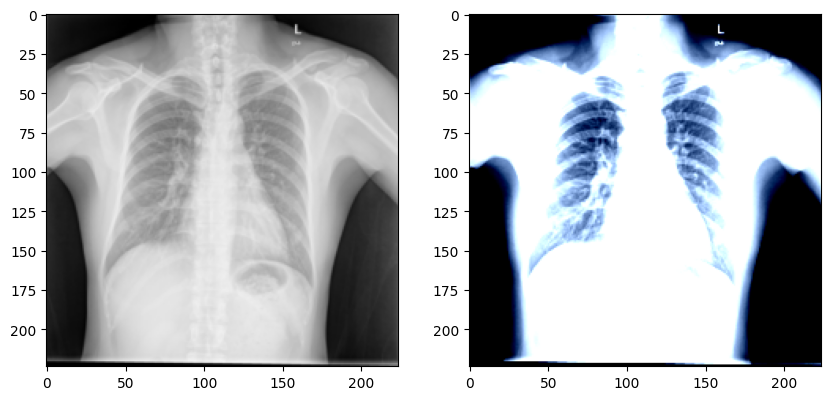

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision.transforms import v2 as T
import os
import PIL


class ROI(Dataset):

  ''' Returns an tensor object that can be batched for segmentation inference'''

  def __init__(self, root_dir):

    # transforms used in the segmentation model for eval, not training

    self.transforms_norm = T.Compose([
        T.Resize((224, 224)),
        T.ToImage(), #converts a PIL Image to tv2_tensor
        T.ToDtype(torch.float32, scale = True), # scales
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])

    self.transforms_orig = T.Compose([
        T.Resize((224, 224)),
        T.ToImage(), #converts a PIL Image to tv2_tensor
        T.ToDtype(torch.float32, scale = True),
    ])

    # directory with Images
    self.root_dir = root_dir

    # sub-directories
    im_id0 = os.listdir (os.path.join(self.root_dir, 'no_tb'))
    im_id1 = os.listdir (os.path.join(self.root_dir, 'tb'))

    # add a tag of 0 and 1 for labelling later
    # im_id0_tag = ['0_' + im for im in im_id0]
    # im_id1_tag = ['1_' + im for im in im_id1]

    # a full list with tagged image names
    # self.im_ls = im_id0_tag + im_id1_tag

    # GEMINI clean GENIUS
    self.im_data = []

    for f in im_id0:
      self.im_data.append(('no_tb', f, 0))

    for f in im_id1:
      self.im_data.append(('tb', f, 1))

  def __len__(self):
    return len(self.im_data)


  def __getitem__(self, idx):

    # if self.im_ls[idx].startswith('0_'):
    #   label = torch.tensor(0).long()
    # else:
    #   label = torch.tensor(1).long()

    # we start from index 2 since that is where the actual image name is found.
    # im_path = os.path.join(self.root_dir, self.im_ls[idx][2:])

    im_path = os.path.join(self.root_dir, self.im_data[idx][0], self.im_data[idx][1])
    label = torch.tensor(self.im_data[idx][2]).long()

    # get the name. will be useful for saving in the inference loop
    im_name = self.im_data[idx][1]


    image = PIL.Image.open(im_path).convert('RGB')

    image_orig = self.transforms_orig(image)

    image_norm = self.transforms_norm(image)

    return image_orig, image_norm, label, im_name

# tensor dataset
td = ROI('./Images')

# confirm images display
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize = (10, 10))

ax[0].imshow(td[0][0].permute(1, 2, 0))
ax[1].imshow(td[0][1].permute(1, 2, 0))

# data loader
dl = DataLoader (td, batch_size = 64)

# Number of batches and images
print (f'Number of batches: {len(dl)}')

# Number of images
print (f'Number of Images: {len(dl.dataset)}')


### Inference

In [ ]:
from torchvision.utils import save_image
import os
import torch
import time  # Import time module

def segmentation_inference(model, data_loader, device, roi_dir):

  model.to(device)
  model.eval()

  # make directories if non_existent
  os.makedirs(os.path.join(roi_dir, 'tb'), exist_ok=True)
  os.makedirs(os.path.join(roi_dir, 'no_tb'), exist_ok=True)

  print(f"Starting inference. Saving images to {roi_dir}...")

  # --- TIMER START ---
  start_time = time.time()

  # Counter to track total images for precise per-image timing
  total_images = 0

  with torch.no_grad():
    for batch_idx, batch in enumerate(data_loader):

      images_orig = batch[0].to(device)
      images_norm = batch[1].to(device)

      label_batch = batch[2] # no need to be in device
      img_name_batch = batch[3]

      # Update count
      total_images += len(images_orig)

      # predicted masks
      masks = model(images_norm)
      pred_masks = masks.argmax(dim=1)

      # roi
      # Broadcasting works here because PyTorch aligns the dimensions from the right.
      # images_orig is [B, 3, H, W] and pred_masks.unsqueeze(1) is [B, 1, H, W].
      roi_batch = images_orig * pred_masks.unsqueeze(1)

      # loop over the batch of roi images generated to save
      for i in range(len(roi_batch)):

        img = roi_batch[i]
        img_name = img_name_batch[i]

        folder = 'tb' if label_batch[i] == 1 else 'no_tb'

        # Note: I removed normalize=True here usually because 'img' is likely already
        # in the correct pixel range from 'images_orig'.
        # If 'images_orig' was 0-255, normalize=True might distort it.
        # If it was 0-1, it's fine. keeping it as you had it.
        save_image(img, os.path.join(roi_dir, folder, img_name), normalize=True)

      if (batch_idx+1) % 5 == 0:
        print(f'Finished saving {batch_idx+1} batches.')

  # --- TIMER END ---
  end_time = time.time()
  total_time = end_time - start_time

  # Display stats
  print("-" * 30)
  print(f"Inference Completed.")
  print(f"Total Time:      {total_time/60:.2f} minutes")

  if total_images > 0:
      print(f"Time per Image:  {total_time / total_images:.4f} seconds")
      print(f"FPS:             {total_images / total_time:.2f}")

# segment
segmentation_inference(model, dl, device, './ROI_Images')

Starting inference. Saving images to ./ROI_Images...
Finished saving 5 batches.
Finished saving 10 batches.
------------------------------
Inference Completed.
Total Time:      2.75 minutes
Time per Image:  0.2346 seconds
FPS:             4.26


### Check ROI Image

Displaying sample ROI image: 1059.png


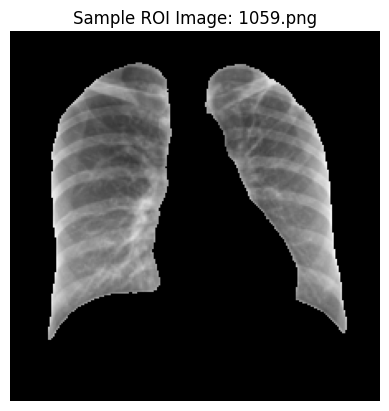

In [ ]:
# GEMINI CODE

import os
import PIL
import matplotlib.pyplot as plt

# Get a list of images in the 'tb' subfolder of ROI_Images
roi_tb_images = os.listdir('./ROI_Images/tb')

if roi_tb_images:
    # Pick the first image from the list
    sample_image_name = roi_tb_images[0]
    path_sample_roi_image = os.path.join('./ROI_Images/tb', sample_image_name)

    # Open and display the image
    print(f"Displaying sample ROI image: {sample_image_name}")
    # PIL.Image.open(path_sample_roi_image)
    plt.imshow(PIL.Image.open(path_sample_roi_image), cmap='gray')
    plt.title(f"Sample ROI Image: {sample_image_name}")
    plt.axis('off')
    plt.show()
else:
    print("No images found in ./ROI_Images/tb. Please ensure the segmentation inference ran successfully.")

# DATA (704)

Segmented Images

## SET UP OF THE DATABASE

In [ ]:
def setup_roi_database(path):

  '''Set up of the ROI Images database to use for classification. The target is
  to just use ImageFolder for the tensor dataset and data loader.

  path is the folder where the images are''' #there was sth causing syntax warning

  import os
  import pandas as pd

  roi_0 = os.listdir(os.path.join(path, 'no_tb'))
  roi_1 = os.listdir(os.path.join(path, 'tb'))

  print('Splitting Details')
  print(f'# of TB images: {len(roi_1)}')
  print(f'# of Normal images: {len(roi_0)}')
  print(f'Total: {len(roi_1) + len(roi_0)}')

  # We will split train, validation and test set using 70%, 20% and 10%.
  # We will consider these ratios at the class level since we want every set
  # have a balanced number of images wrt the classes.

  train_ratio = 0.7
  val_ratio = 0.2
  test_ratio = 0.1

  # int uses floor, so the test set will have a couple more images than intended
  train_no_1 = int(train_ratio * len(roi_1))
  train_no_0 = int(train_ratio * len(roi_0))
  # print(f'Train: {train_no_1} + {train_no_0} = {train_no_1 + train_no_0}')

  val_no_1 = int(val_ratio * len(roi_1))
  val_no_0 = int(val_ratio * len(roi_0))
  # print(f'Validation: {val_no_1} + {val_no_0} = {val_no_1 + val_no_0}')

  test_no_1 = int(test_ratio * len(roi_1))
  test_no_0 = int(test_ratio * len(roi_0))
  # print(f'Test: {test_no_1} + {test_no_0} = {test_no_1 + test_no_0}')

  # split
  train_1 = roi_1[:train_no_1]
  train_0 = roi_0[:train_no_0]
  train = train_1 + train_0
  print(f'Train set #: {len(train)}')

  val_1 = roi_1[train_no_1:train_no_1 + val_no_1]
  val_0 = roi_0[train_no_0:train_no_0 + val_no_0]
  val = val_1 + val_0
  print(f'Validation set #: {len(val)}')

  test_1 = roi_1[train_no_1 + val_no_1:]
  test_0 = roi_0[train_no_0 + val_no_0:]
  test = test_1 + test_0
  print(f'Test set #: {len(test)}')

  print(f'Total: {len(train) + len(val) + len(test)}')
  print()


  ## set up directories

  print ('Setting up directories..')
  import os
  import shutil

  sets = ['train', 'val', 'test']
  klases = ['tb', 'no_tb']

  current_path = os.getcwd()

  for s in sets:
    for klas in klases:
      os.makedirs(os.path.join(current_path, s, klas), exist_ok = True)

  # copying from the image path to set up directories. code is really repetitive and bad, but it works!

  #train
  for i in train_1:
    shutil.copy(src = os.path.join(path,'tb', i), dst = os.path.join(current_path,'train','tb'))

  for i in train_0:
    shutil.copy(src = os.path.join(path,'no_tb', i), dst = os.path.join(current_path,'train','no_tb'))

  # val
  for i in val_1:
    shutil.copy(src = os.path.join(path,'tb', i), dst = os.path.join(current_path,'val','tb'))

  for i in val_0:
    shutil.copy(src = os.path.join(path,'no_tb', i), dst = os.path.join(current_path,'val','no_tb'))

  #test
  for i in test_1:
    shutil.copy(src = os.path.join(path,'tb', i), dst = os.path.join(current_path,'test','tb'))

  for i in test_0:
    shutil.copy(src = os.path.join(path,'no_tb', i), dst = os.path.join(current_path,'test','no_tb'))

setup_roi_database('./ROI_Images')

Splitting Details
# of TB images: 345
# of Normal images: 359
Total: 704
Train set #: 492
Validation set #: 140
Test set #: 72
Total: 704

Setting up directories..


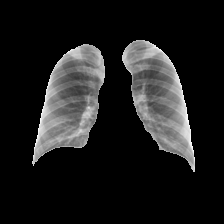

In [ ]:
import PIL

path_image = os.path.join('./train', 'no_tb', '1000.png')
PIL.Image.open(path_image)

### Dataset Preparation

In [ ]:
## DATASET

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision import transforms as T
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

# from torchview import draw_graph

transforms = T.Compose([
    # T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225] )
])

train_td = ImageFolder(root = './train', transform = T.Compose([
    # T.Resize((224, 224)),
    T.RandomHorizontalFlip(p = 0.5),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225] )

])
)

val_td = ImageFolder(root = './val', transform = transforms)
test_td = ImageFolder(root = './test', transform = transforms)

train_dl = DataLoader(train_td, batch_size = 32, shuffle = True)
val_dl = DataLoader(val_td, batch_size = 32)
test_dl = DataLoader(test_td, batch_size = 32)

print (f'Number of batches in train: {len(train_dl)}')
print (f'Number of batches in val: {len(val_dl)}')
print (f'Number of batches in test: {len(test_dl)}')

Number of batches in train: 16
Number of batches in val: 5
Number of batches in test: 3


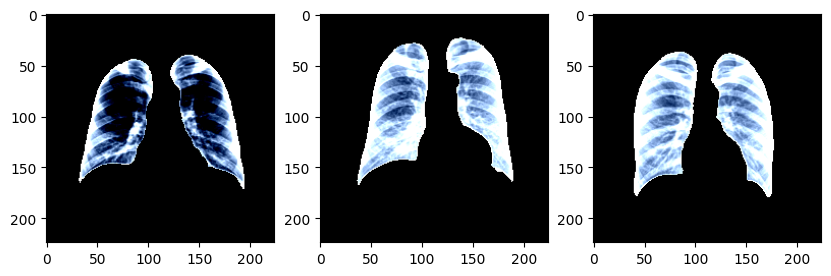

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize = (10, 10))

ax[0].imshow(train_td[0][0].permute(1, 2, 0))
ax[1].imshow(test_td[1][0].permute(1, 2, 0))
ax[2].imshow(val_td[2][0].permute(1, 2, 0))

### Efficient net run 1

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth


100%|██████████| 47.2M/47.2M [00:00<00:00, 126MB/s]


Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=2, bias=True)
)
CONV Layer: False
BN Layer: True
Epoch: [1/20]	 Train Loss: 0.65	    Val Loss: 0.66	 Train Acc: 0.61	 Val Acc: 0.65    Train Time: 0.10	 Val Time: 0.01
Epoch: [2/20]	 Train Loss: 0.58	    Val Loss: 0.62	 Train Acc: 0.73	 Val Acc: 0.68    Train Time: 0.08	 Val Time: 0.01
Epoch: [3/20]	 Train Loss: 0.53	    Val Loss: 0.61	 Train Acc: 0.76	 Val Acc: 0.71    Train Time: 0.07	 Val Time: 0.01
Epoch: [4/20]	 Train Loss: 0.47	    Val Loss: 0.56	 Train Acc: 0.79	 Val Acc: 0.79    Train Time: 0.08	 Val Time: 0.01
Epoch: [5/20]	 Train Loss: 0.44	    Val Loss: 0.52	 Train Acc: 0.79	 Val Acc: 0.79    Train Time: 0.08	 Val Time: 0.01
Epoch: [6/20]	 Train Loss: 0.43	    Val Loss: 0.52	 Train Acc: 0.80	 Val Acc: 0.81    Train Time: 0.08	 Val Time: 0.01
Epoch: [7/20]	 Train Loss: 0.45	    Val Loss: 0.52	 Train Acc: 0.79	 Val Acc: 0.81    Train Time: 0.08	 Val Time: 0.01
Epoch: [8/20]	 Train Loss

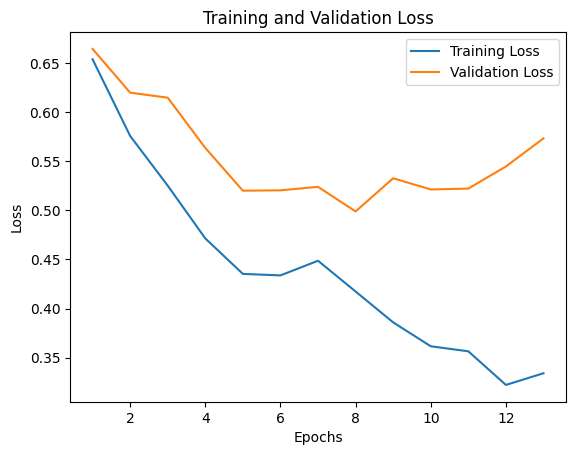

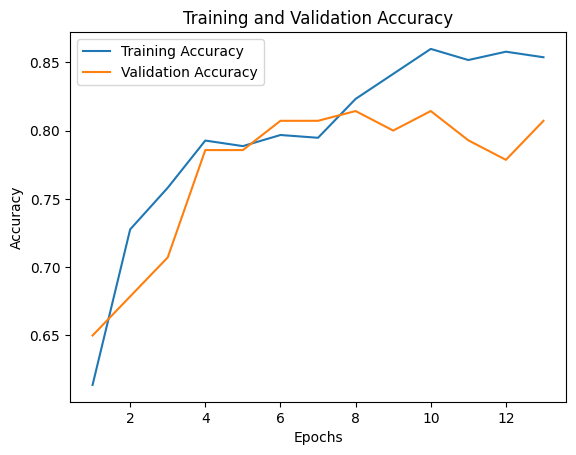

Training time : 1.01
Validation time : 0.13
Prediction Metrics
Confusion Matrix: [[31  6]
 [ 8 27]]
Test Accuracy: 0.81
Test f1: 0.79
Test AUC: 0.89
Time: 0.01


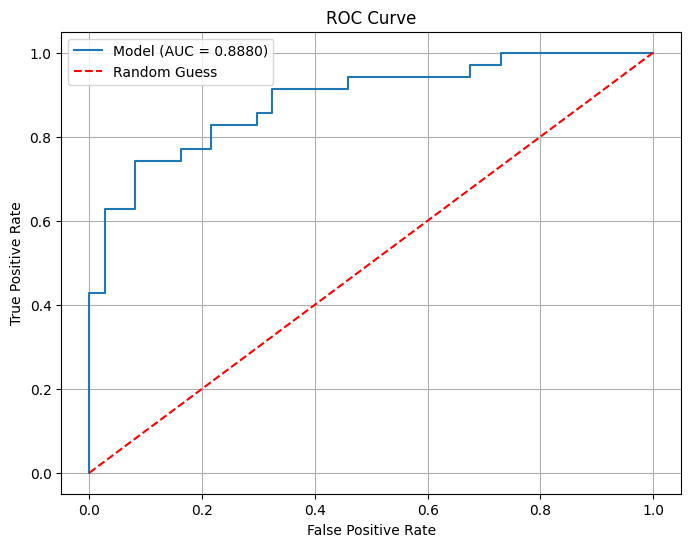

In [ ]:
from torchvision.models import efficientnet_b3

# model
enet = efficientnet_b3(weights = 'DEFAULT')

# FREEZE ALL
for param in enet.parameters():
  param.requires_grad = False

# UNFREEZE BATCH NORM
for module in enet.modules():
  if isinstance(module, nn.BatchNorm2d):
    for param in module.parameters():
      param.requires_grad = True

# ADD NEW CLASSIFIER HEAD
enet.classifier[1] = nn.Linear(enet.classifier[1].in_features, 2)

# VERIFICATION
print(enet.classifier)
print('CONV Layer:', enet.features[0][0].weight.requires_grad)
print('BN Layer:', enet.features[0][1].weight.requires_grad)


# TRAINING
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# optimizer
optimizer = optim.Adam(enet.parameters(), lr = 0.001, betas = (0.9, 0.99))

#loss function
loss_fn = nn.CrossEntropyLoss()

# save path
path_classification = '/content/drive/MyDrive/MSc Data Science/Thesis/Codes/classification'
save_path = os.path.join(path_classification, 'enet_class_seg_704.pt')

history_train = model_train_save_es(enet, train_dl, val_dl,
             optimizer, loss_fn, save_path, epochs = 20, patience = 5, device = device
)

#plot
plot_results_new(history_train)

# total time taken for training and validation
print(f"Training time : {sum(history_train['Training']['Time']):.2f}")
print(f"Validation time : {sum(history_train['Validation']['Time']):.2f}")

# PREDICTING
predictions, probs, labels = model_predict(save_path, test_dl, device)